In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

import tensorflow as tf
import numpy as np
import pandas as pd

import time
from datetime import timedelta

import math
import os

import scipy.misc

from random import sample
import pickle

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

# Image manipulation
import PIL.Image
from IPython.display import display

# Open a Zip File
from zipfile import ZipFile
from io import BytesIO

In [2]:
!pip install tensorflow

In [3]:
import gc
gc.collect()
import numpy as np
import pandas as pd
import os
fpath="C:\\Users\\taris\\archive (2)\\images\\Images"
print(os.listdir(fpath))
dog_classes=os.listdir(fpath)

['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-Walker_hound', 'n02089973-English_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-Irish_wolfhound', 'n02091032-Italian_greyhound', 'n02091134-whippet', 'n02091244-Ibizan_hound', 'n02091467-Norwegian_elkhound', 'n02091635-otterhound', 'n02091831-Saluki', 'n02092002-Scottish_deerhound', 'n02092339-Weimaraner', 'n02093256-Staffordshire_bullterrier', 'n02093428-American_Staffordshire_terrier', 'n02093647-Bedlington_terrier', 'n02093754-Border_terrier', 'n02093859-Kerry_blue_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02094258-Norwich_terrier', 'n02094433-Yorkshire_t

In [4]:
breeds=[breeds.split('-',1)[1] for breeds in dog_classes]
breeds

['Chihuahua',
 'Japanese_spaniel',
 'Maltese_dog',
 'Pekinese',
 'Shih-Tzu',
 'Blenheim_spaniel',
 'papillon',
 'toy_terrier',
 'Rhodesian_ridgeback',
 'Afghan_hound',
 'basset',
 'beagle',
 'bloodhound',
 'bluetick',
 'black-and-tan_coonhound',
 'Walker_hound',
 'English_foxhound',
 'redbone',
 'borzoi',
 'Irish_wolfhound',
 'Italian_greyhound',
 'whippet',
 'Ibizan_hound',
 'Norwegian_elkhound',
 'otterhound',
 'Saluki',
 'Scottish_deerhound',
 'Weimaraner',
 'Staffordshire_bullterrier',
 'American_Staffordshire_terrier',
 'Bedlington_terrier',
 'Border_terrier',
 'Kerry_blue_terrier',
 'Irish_terrier',
 'Norfolk_terrier',
 'Norwich_terrier',
 'Yorkshire_terrier',
 'wire-haired_fox_terrier',
 'Lakeland_terrier',
 'Sealyham_terrier',
 'Airedale',
 'cairn',
 'Australian_terrier',
 'Dandie_Dinmont',
 'Boston_bull',
 'miniature_schnauzer',
 'giant_schnauzer',
 'standard_schnauzer',
 'Scotch_terrier',
 'Tibetan_terrier',
 'silky_terrier',
 'soft-coated_wheaten_terrier',
 'West_Highland_wh

In [5]:
from itertools import chain
X=[]
y=[]

fullpaths=["C:\\Users\\taris\\archive (2)\\images\\Images\\{}".format(dog_class) for dog_class in dog_classes]

for counter, fullpath in enumerate(fullpaths):
    for imgname in os.listdir(fullpath):
        X.append([fullpath+"\\"+imgname])
        y.append(breeds[counter])

print(X[:10],'\n')
print(y[:10],'\n')

X=list(chain.from_iterable(X))
print(X[:10],'\n')
len(X)

[['C:\\Users\\taris\\archive (2)\\images\\Images\\n02085620-Chihuahua\\n02085620_10074.jpg'], ['C:\\Users\\taris\\archive (2)\\images\\Images\\n02085620-Chihuahua\\n02085620_10131.jpg'], ['C:\\Users\\taris\\archive (2)\\images\\Images\\n02085620-Chihuahua\\n02085620_10621.jpg'], ['C:\\Users\\taris\\archive (2)\\images\\Images\\n02085620-Chihuahua\\n02085620_1073.jpg'], ['C:\\Users\\taris\\archive (2)\\images\\Images\\n02085620-Chihuahua\\n02085620_10976.jpg'], ['C:\\Users\\taris\\archive (2)\\images\\Images\\n02085620-Chihuahua\\n02085620_11140.jpg'], ['C:\\Users\\taris\\archive (2)\\images\\Images\\n02085620-Chihuahua\\n02085620_11238.jpg'], ['C:\\Users\\taris\\archive (2)\\images\\Images\\n02085620-Chihuahua\\n02085620_11258.jpg'], ['C:\\Users\\taris\\archive (2)\\images\\Images\\n02085620-Chihuahua\\n02085620_11337.jpg'], ['C:\\Users\\taris\\archive (2)\\images\\Images\\n02085620-Chihuahua\\n02085620_11477.jpg']] 

['Chihuahua', 'Chihuahua', 'Chihuahua', 'Chihuahua', 'Chihuahua', 'C

20580

In [6]:
import random
combined=list(zip(X,y))
random.shuffle(combined)
print(combined[:10],'\n')
X[:],y[:]=zip(*combined)


[('C:\\Users\\taris\\archive (2)\\images\\Images\\n02090721-Irish_wolfhound\\n02090721_1706.jpg', 'Irish_wolfhound'), ('C:\\Users\\taris\\archive (2)\\images\\Images\\n02107908-Appenzeller\\n02107908_2382.jpg', 'Appenzeller'), ('C:\\Users\\taris\\archive (2)\\images\\Images\\n02115641-dingo\\n02115641_10395.jpg', 'dingo'), ('C:\\Users\\taris\\archive (2)\\images\\Images\\n02107908-Appenzeller\\n02107908_7690.jpg', 'Appenzeller'), ('C:\\Users\\taris\\archive (2)\\images\\Images\\n02088466-bloodhound\\n02088466_9110.jpg', 'bloodhound'), ('C:\\Users\\taris\\archive (2)\\images\\Images\\n02113799-standard_poodle\\n02113799_254.jpg', 'standard_poodle'), ('C:\\Users\\taris\\archive (2)\\images\\Images\\n02109047-Great_Dane\\n02109047_13016.jpg', 'Great_Dane'), ('C:\\Users\\taris\\archive (2)\\images\\Images\\n02097658-silky_terrier\\n02097658_4992.jpg', 'silky_terrier'), ('C:\\Users\\taris\\archive (2)\\images\\Images\\n02111889-Samoyed\\n02111889_1968.jpg', 'Samoyed'), ('C:\\Users\\taris\\a

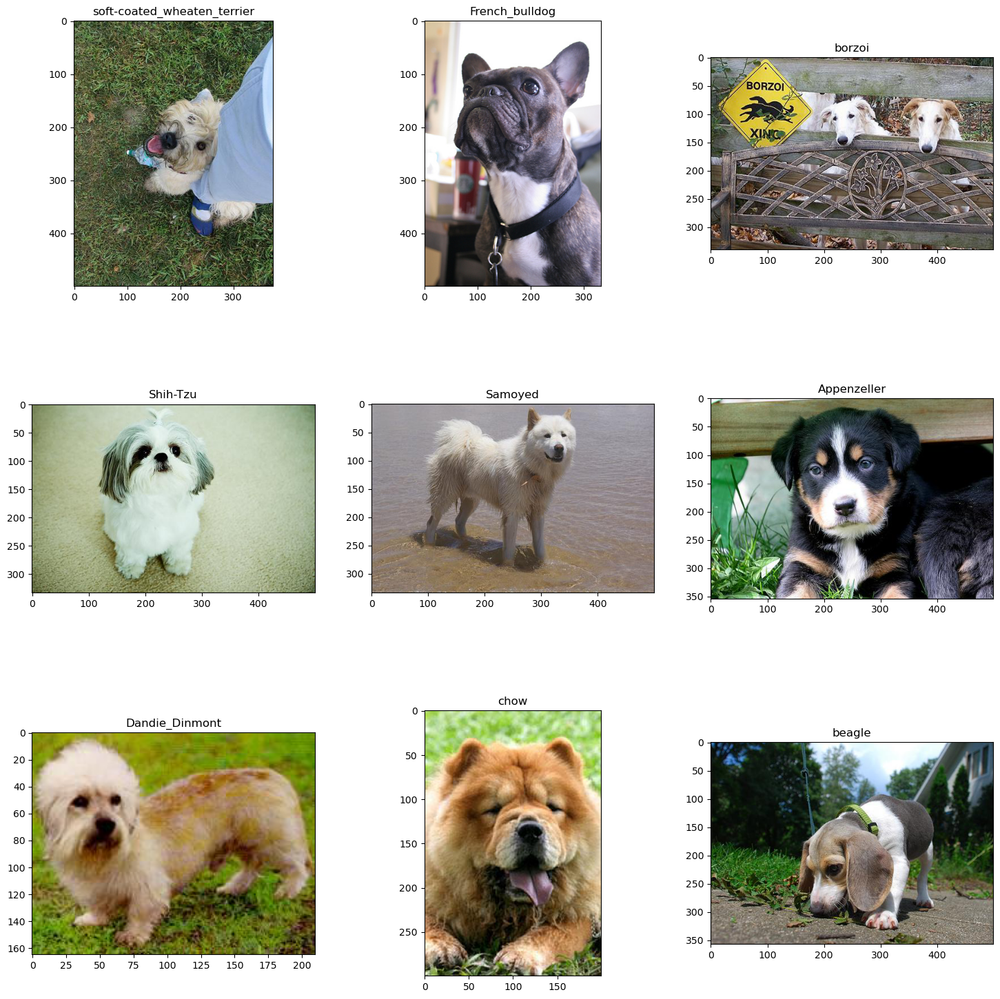

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.image import imread

plt.figure(figsize=(18,18))

for counter,i in enumerate(random.sample(range(0,len(X)),9)):
    plt.subplot(3,3,counter+1)
    plt.subplots_adjust(hspace=0.3)
    filename=X[i]
    image=imread(filename)
    plt.imshow(image)
    plt.title(y[i],fontsize=12)
plt.show()  

In [8]:
X=X[:1000]
y=y[:1000]


In [9]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

le=LabelEncoder()
le.fit(y)
y_ohe=to_categorical(le.transform(y),len(breeds))
print(y_ohe.shape)
y_ohe=np.array(y_ohe)

(1000, 120)


In [10]:
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img

img_data=np.array([img_to_array(load_img(img,target_size=(299,299,3))) for img in X])
print(img_data.shape)
x_train,x_test,y_train,y_test=train_test_split(img_data,y_ohe,test_size=0.2,random_state=2)
x_train,x_val,y_train,y_val=train_test_split(x_train,y_train,test_size=0.2,random_state=2)

print("Training dataset size: ",x_train.shape)
print("Validation dataset size: ",x_val.shape)
print("Testing dataset size: ",x_test.shape)
print("Training Label size: ",y_train.shape)
print("Validation Label size: ",y_val.shape)
print("Testing Label size: ",y_test.shape)

(1000, 299, 299, 3)
Training dataset size:  (640, 299, 299, 3)
Validation dataset size:  (160, 299, 299, 3)
Testing dataset size:  (200, 299, 299, 3)
Training Label size:  (640, 120)
Validation Label size:  (160, 120)
Testing Label size:  (200, 120)


In [11]:
import gc
del img_data
gc.collect()

25150

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


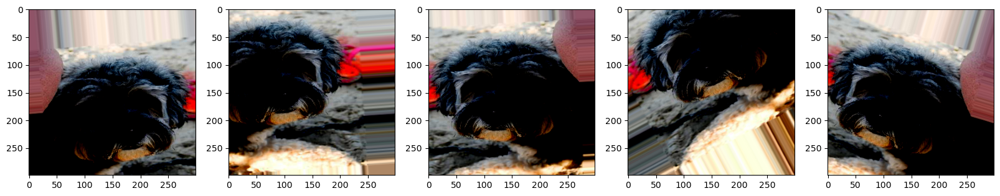

In [12]:


import matplotlib.pyplot as plt
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Assuming x_train, y_train, x_val, and y_val are defined
batch_size = 32
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

train_generator = train_datagen.flow(x_train, y_train, shuffle=False, batch_size=batch_size, seed=1)
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
val_generator = val_datagen.flow(x_val, y_val, shuffle=False, batch_size=batch_size, seed=1)

img_id = 2
dog_generator = train_datagen.flow(x_train[img_id:img_id+1], y_train[img_id:img_id+1], shuffle=False, batch_size=1, seed=1)

plt.figure(figsize=(20, 20))
dogs = [next(dog_generator) for _ in range(5)]
for counter, dog in enumerate(dogs):
    plt.subplot(1, 5, counter + 1)
    plt.imshow(dog[0][0])
plt.show()


In [13]:
from tensorflow.keras import layers, models
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Flatten, Dense, Input, InputLayer
input_shape = (299, 299, 3)

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
# x = base_model.output
# x = GlobalAveragePooling2D()(input_layer)
# x = Dropout(0.3)(input_layer)
# x = Dense(512, activation='relu')(input_layer)
# x = Dense(512, activation='relu')(input_layer)
# x = Dense(len(breeds), activation='softmax')(input_layer)
# model = Model(inputs=input_layer, outputs=x)
# print(len(model.trainable_weights))
# model.layers[0].trainable=False
# print(len(model.trainable_weights))

model =models.Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.3))
model.add(Dense(512, activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dense(len(breeds), activation='softmax'))

print(len(model.trainable_weights))
model.layers[0].trainable=False
print(len(model.trainable_weights))

model.compile(Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
# model.summary()
          

188
0


In [14]:
train_steps_per_epoch=x_train.shape[0]
val_steps_per_epoch=x_val.shape[0]
epochs=30

history = model.fit(
    train_generator,
    steps_per_epoch=train_steps_per_epoch,
    validation_data=val_generator,
    validation_steps=val_steps_per_epoch,
    epochs=epochs,
    verbose=1
)

Epoch 1/30


C:\Users\taris\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


 20/640 ━━━━━━━━━━━━━━━━━━━━ 24:54 2s/step - accuracy: 0.0160 - loss: 4.8432

C:\Users\taris\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)


640/640 ━━━━━━━━━━━━━━━━━━━━ 87s 98ms/step - accuracy: 0.0187 - loss: 4.8101 - val_accuracy: 0.0250 - val_loss: 4.6870
Epoch 2/30
640/640 ━━━━━━━━━━━━━━━━━━━━ 68s 94ms/step - accuracy: 0.0657 - loss: 4.5697 - val_accuracy: 0.0938 - val_loss: 4.5344
Epoch 3/30
640/640 ━━━━━━━━━━━━━━━━━━━━ 73s 102ms/step - accuracy: 0.1577 - loss: 4.3780 - val_accuracy: 0.2562 - val_loss: 4.3600
Epoch 4/30
640/640 ━━━━━━━━━━━━━━━━━━━━ 69s 95ms/step - accuracy: 0.2762 - loss: 4.1114 - val_accuracy: 0.3125 - val_loss: 4.1266
Epoch 5/30
640/640 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - accuracy: 0.3921 - loss: 3.7695 - val_accuracy: 0.3812 - val_loss: 3.7693
Epoch 6/30
640/640 ━━━━━━━━━━━━━━━━━━━━ 61s 84ms/step - accuracy: 0.4781 - loss: 3.3751 - val_accuracy: 0.4938 - val_loss: 3.3587
Epoch 7/30
640/640 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step - accuracy: 0.5825 - loss: 2.8859 - val_accuracy: 0.5437 - val_loss: 2.8991
Epoch 8/30
640/640 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - accuracy: 0.6704 - loss: 2.4205 - val_accura

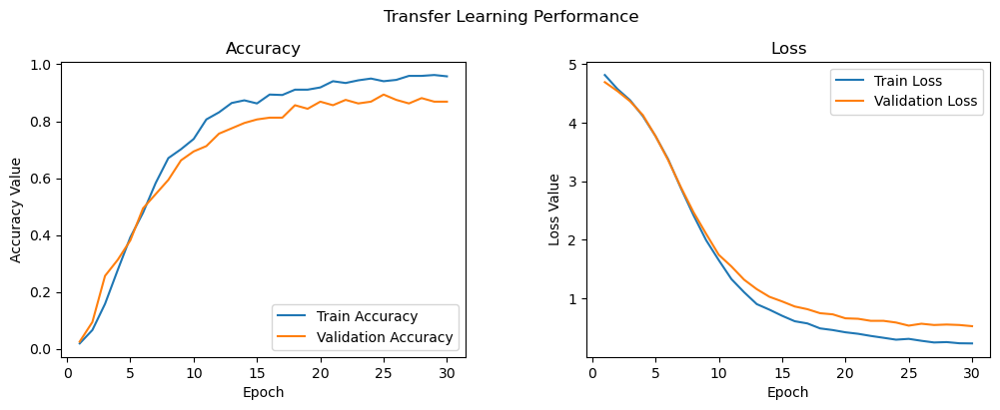

In [15]:
# Plot Accuracy and Loss
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle('Transfer Learning Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1, epochs+1))

ax1.plot(epoch_list, history.history['accuracy'], label='Train Accuracy')
ax1.plot(epoch_list, history.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, epochs+1, 5))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc='best')

ax2.plot(epoch_list, history.history['loss'], label='Train Loss')
ax2.plot(epoch_list, history.history['val_loss'], label='Validation Loss')
ax2.set_xticks(np.arange(0, epochs+1, 5))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc='best')

In [16]:
x_test1=x_test/255
test_predictions=model.predict(x_test1)
predictions=le.classes_[np.argmax(test_predictions,axis=1)]
target_labels=le.classes_[np.argmax(y_test,axis=1)]
predict_df=pd.DataFrame({'Target_Labels':target_labels,'Perdiction':predictions})
predict_df

7/7 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step


,Target_Labels,Perdiction
0,Welsh_springer_spaniel,Welsh_springer_spaniel
1,cairn,cairn
2,toy_poodle,miniature_poodle
3,Norwich_terrier,Norwich_terrier
4,Doberman,Doberman
...,...,...
195,curly-coated_retriever,curly-coated_retriever
196,keeshond,keeshond
197,Tibetan_terrier,Tibetan_terrier
198,Pembroke,Pembroke


In [17]:
correct=(target_labels==predictions)
accuracy=correct.sum()/correct.size
print(accuracy)         

0.86


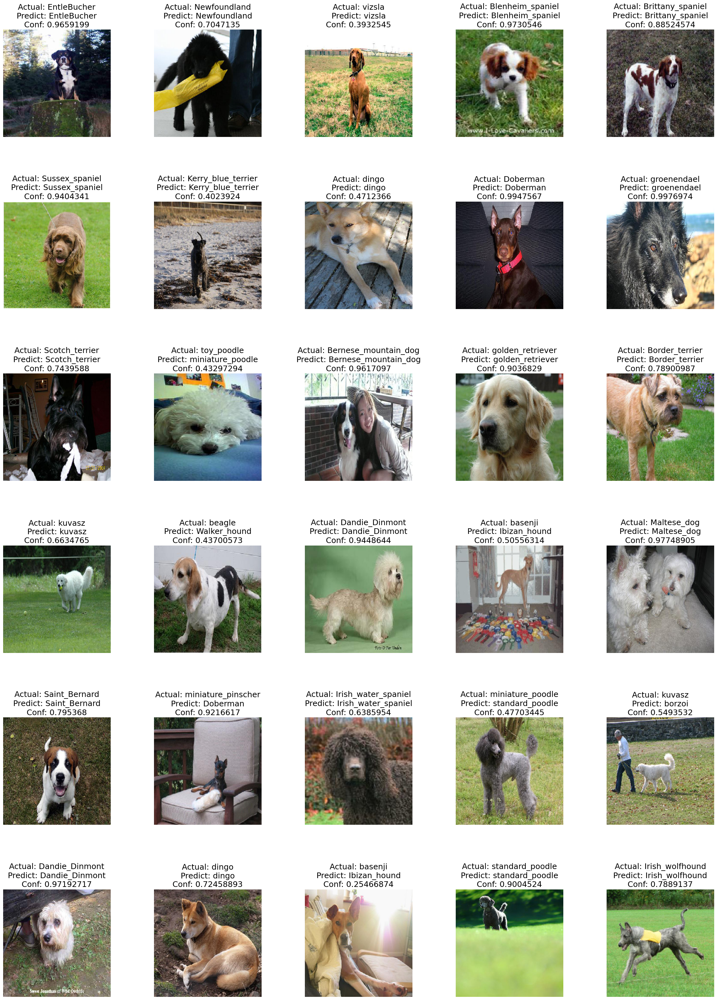

In [18]:
import matplotlib.pyplot as plt
import random

# Assuming x_test, y_test, target_labels, predictions, and test_predictions are already defined

# Plot Actual vs Predicted Images with Confidence Levels
plt.figure(figsize=(30, 40))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 30)):  # random 30 images
    plt.subplot(6, 5, counter+1)
    plt.subplots_adjust(hspace=0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))
    plt.imshow(x_test[i]/255.0)
    plt.axis('off')
    plt.title('Actual: ' + actual + '\nPredict: ' + predicted + '\nConf: ' + conf, fontsize=18)

plt.show()